In [368]:
import netket as nk
import matplotlib.pyplot as plt
import numpy as np
from netket.operator.spin import sigmax,sigmaz,sigmay,identity,sigmam,sigmap   
import flax
import jax
import jax.numpy as jnp
import flax.linen as nn
from scipy.sparse.linalg import eigsh 
from netket import nn as nknn
from Methods.class_WF import Diag
import Methods.class_WF as class_WF
import Methods.var_nk as var_nk
import os
os.environ["JAX_ENABLE_X64"] = "True"
import matplotlib as mpl
import numpy as np
import sys
import pandas as pd
import equinox as eqx
import os
import json
from matplotlib import cm
import matplotlib as mp
import matplotlib.colors as mcolors
import scipy.special as sc
import scipy.optimize as so
from matplotlib.colors import LinearSegmentedColormap
from functools import reduce
from scipy.sparse import triu

In [279]:
#DEFINE FUNCTIONS:

In [280]:
from Methods.class_WF import rotated_sigmax, rotated_sigmaz,isigmay,rotated_IsingModel,rotated_LONGIsingModel,rotated_BROKEN_Z2IsingModel,rotated_CIMModel_2
from Methods.class_WF import rotated_XYZModel, parity_Matrix, parity_IsingModel, Sz0Szj, Sx0Sxj, to_array, rotated_m, rotated_CIMModel, rotated_CIMModel_Y

In [281]:
def GET_PROB_RBM(hi,param_RBM,j):
    
    #DEFINE THE PARAMETERS OF THE RBM
    AA=np.array(param_RBM["params"]["Dense"]["kernel"]["value"]["real"][j])+1j*np.array(param_RBM["params"]["Dense"]["kernel"]["value"]["imag"][j])
    BB=np.array(param_RBM["params"]["Dense"]["bias"]["value"]["real"][j])+1j*np.array(param_RBM["params"]["Dense"]["bias"]["value"]["imag"][j])
    CC=np.array(param_RBM["params"]["visible_bias"]["value"]["real"][j])+1j*np.array(param_RBM["params"]["visible_bias"]["value"]["imag"][j])
    
    #DEFINE THE STATES
    states=hi.all_states()
    
    #AUXILIAR MATRIX
    DD=np.tile(BB,(len(states),1))
    
    #COMPUTE THE PROBABILITIES
    
    logKK=states@CC
    log_AMP=np.log(np.cosh(states@AA+DD))
    log_ALMOST_PROB=np.sum(log_AMP,axis=-1)+logKK
    log_NORM=log_ALMOST_PROB+np.conjugate(log_ALMOST_PROB)
    NORM=np.sqrt(np.sum(np.exp(log_NORM)))
    
    PROB=np.exp(log_ALMOST_PROB)/NORM
    #------------------------------
    #KK=np.exp(states@CC)
    #AMP=np.cosh(states@AA+DD)
    #ALMOST_PROB=KK*np.prod(AMP,axis=-1)
    
    #NORMALIZE THE PROBABILITY
    #NORM=np.sqrt(ALMOST_PROB@np.conjugate(ALMOST_PROB))
    #PROB=ALMOST_PROB/NORM
    
    return PROB

In [282]:
#DEFINE THE VARIABLES:

In [360]:
L=20
NS=4096
G=50
DG=0.01
NN=1
NL=1
NR=500
learning_rate=0.05
basis="QIM"
modelo="RBM_COMPLEX"
##########################
angle=0
Nangle=12
dangle=np.pi/(2*Nangle)
NSPCA=100
NM=1
##########################



MASTER_DIR="EXACT_RUN_"+basis+"_"+modelo+"NN"+str(NN)+"L"+str(L)+"G"+str(G)+"NA"+str(Nangle)+"NSPCA"+str(NSPCA)
Nstates=2**L
eps=10**(-10)
angle=[dangle*i for i in range(Nangle+1)]
num_states=[i for i in range(2**L)]

labels=[r"$"+str(i)+r"\times\frac{\pi}{"+str(2*Nangle)+"}"+"$" for i in range(Nangle+1)]
try:
    os.mkdir(MASTER_DIR)
except:
    print("DIRECTORY ALREADY CREATED")
OBS_FILENAME="NANGLE"+str(Nangle)+basis+"M3L"+str(L)+"W1"+"G"+str(G)+"NS"+str(NS)+"NN"+str(NN)+"NL"+str(NL)+"NR"+str(NR)+"OBS"
SPCA_FILENAME="NANGLE"+str(Nangle)+basis+"M3L"+str(L)+"W1"+"G"+str(G)+"NS"+str(NS)+"NN"+str(NN)+"NL"+str(NL)+"NR"+str(NR)+"SPCA"
VAR_FILENAME="NANGLE"+str(Nangle)+basis+"M3L"+str(L)+"W1"+"G"+str(G)+"NS"+str(NS)+"NN"+str(NN)+"NL"+str(NL)+"NR"+str(NR)+"VAR"

In [361]:
norm = mcolors.Normalize(vmin=np.abs(0), vmax=1)
colors = [(0.0, 'yellow'),(0.25, "green"),(0.5, 'blue'),(0.75,"brown"),(1.0, 'red')]
cmap = LinearSegmentedColormap.from_list('custom_blue_green', colors)

In [362]:
#EXACT DIAGONALIZATION AND COMPUTING THE ORDER PARAMETER

In [363]:
#SOLUTION OF THE ISING MODEL AS A FUNCTION OF THETA:

In [364]:
#SOLUTION OF THE ISING MODEL AND ITS PARAMETERS...

In [ ]:
S_PCA_TEO=[0.0 for i in angle]
PSI_TEO=[None for i in angle]
EXC_PSI_TEO=[None for i in angle]
N_pos=[0.0 for i in range(Nangle+1)]
hi=nk.hilbert.Spin(s=1/2,N=L)
states=hi.all_states()
eps=10**(-10)
for theta in range(len(angle)):
    #PSI AND DIAGONALIZATION
    H=rotated_IsingModel(angle[theta],G*DG,L,hi)
    #H=rotated_CIMModel_Y(angle[theta],G*DG,L,hi)
    #H=rotated_CIMModel_2(angle[theta],G*DG,L,hi)
    #eig_vals_other,eig_vecs_other=np.linalg.eigh(H.to_dense())
    eig_vals_other,eig_vecs_other=eigsh(H.to_sparse())
    
    PSI_TEO[theta]=eig_vecs_other[:,0]
    EXC_PSI_TEO[theta]=eig_vecs_other[:,3]
    if PSI_TEO[theta][0]<0:
        PSI_TEO[theta]=(-1.0)*PSI_TEO[theta]
    
   # A=np.random.choice(num_states,size=1000,p=eig_vecs_other[:,0]**2)
   # B=np.array([states[a] for a in A])
    #S_PCA_TEO[theta]=class_WF.S_PCA(B,10**(-10),exvar=False)
    #SIGN PROBLEM
    
    #H_array=to_array(H)*1.0
    #off_diag_indices=np.triu_indices(2**(L),k=1)
    #aux_1=H_array[off_diag_indices]
    #aux_2=aux_1[np.abs(aux_1)>eps]
    #N_pos[theta]=np.sum((aux_2>eps)*1.0)

    #SIGN PROBLEM SPARSE VERSION
    H_triu = triu(H.to_sparse(), k=1)
    # Get the data and row/col indices of non-zero entries
    data = H_triu.data
    # Filter elements with absolute value > eps
    mask = np.abs(data) > eps
    filtered_data = data[mask]
    # Count how many are > eps (i.e., positive and above threshold)
    N_pos[theta] = np.sum(filtered_data > eps)
    print("step",theta,"done")
    
sisj_z=[ PSI_TEO[0].T@Sz0Szj(0.0,L,hi,j).to_dense()@PSI_TEO[0] for j in [1,int(L/2),L-1]]
sisj_x=[ PSI_TEO[0].T@Sx0Sxj(0.0,L,hi,j).to_dense()@PSI_TEO[0] for j in [1,int(L/2),L-1]]



step 0 done
step 1 done
step 2 done
step 3 done
step 4 done
step 5 done
step 6 done
step 7 done
step 8 done
step 9 done
step 10 done
step 11 done
step 12 done


In [ ]:
N_pos

In [ ]:
# INITIALIZE NETKET TOOLS
sites_corr=[1,int(L/2),L-1]
sites_corr=[str(x) for x in sites_corr]
S=[[[0.0 for k in range(NSPCA)] for i in range(len(angle))] for rep in range(NM)]
E=[[[0.0 for k in range(NR)]  for i in range(len(angle))] for rep in range(NM)]
dE=[[[0.0 for k in range(NR)] for i in range(len(angle))] for rep in range(NM)]
P=[[[0.0 for k in range(NR)] for i in range(len(angle))] for rep in range(NM)]
dP=[[[0.0 for k in range(NR)] for i in range(len(angle))] for rep in range(NM)]

indexes=[[[(rep,i,k) for k in range(NR)] for i in range(len(angle))] for rep in range(NM)]
indexes_S=[[[(rep,i,k) for k in range(NSPCA+1)] for i in range(len(angle))] for rep in range(NM)]

CZ=[[[None for corr in sites_corr] for i in range(len(angle))] for rep in range(NM)]
dCZ=[[ [None for corr in sites_corr] for i in range(len(angle))] for rep in range(NM)]

CX=[[ [None for corr in sites_corr] for i in range(len(angle))] for rep in range(NM)]
dCX=[[ [None for corr in sites_corr] for i in range(len(angle))] for rep in range(NM)]

data_RBM=[[[0.0 for k in range(NR)] for i in range(len(angle))] for rep in range(NM)]
data_S_PCA=[[[0.0 for k in range(NSPCA)] for i in range(len(angle))] for rep in range(NM)]
data=[[None for i in range(len(angle))] for rep in range(NM)]

# Load the data from the JSON file
for rep in range(NM):
    for ii in range(len(angle)):
    
        with open(MASTER_DIR+"/"+str(rep)+"NM"+str(ii)+OBS_FILENAME+".json", "r") as f:
            data_RBM[rep][ii] = json.load(f)
        with open(MASTER_DIR+"/"+str(rep)+"NM"+str(ii)+VAR_FILENAME+".json", "r") as f:
            data[rep][ii] = json.load(f)

        with open(MASTER_DIR+"/"+str(rep)+"NM"+str(ii)+SPCA_FILENAME+".json", "r") as f:
            data_S_PCA[rep][ii] = json.load(f)
        
        E[rep][ii]=np.real(data_RBM[rep][ii]["Energy"]["Mean"]["real"])
        dE[rep][ii]=np.real(data_RBM[rep][ii]["Energy"]["Sigma"])
        #P[rep][ii]=np.real(data_RBM[rep][ii]["P"]["Mean"])
        #dP[rep][ii]=np.real(data_RBM[rep][ii]["P"]["Sigma"])
        S[rep][ii]=np.real(data_S_PCA[rep][ii]["Mean"]["value"])
    
        for xi in range(len(sites_corr)):
            CZ[rep][ii][xi]=np.real(data_RBM[rep][ii]["CZ0"+sites_corr[xi]]["Mean"])
            dCZ[rep][ii][xi]=np.real(data_RBM[rep][ii]["CZ0"+sites_corr[xi]]["Sigma"])
            CX[rep][ii][xi]=np.real(data_RBM[rep][ii]["CX0"+sites_corr[xi]]["Mean"])
            dCX[rep][ii][xi]=np.real(data_RBM[rep][ii]["CX0"+sites_corr[xi]]["Sigma"])

#print(np.array(E) == None)

E=np.array(E)
#S=np.array(S)
indexes=np.array(indexes)
indexes_S=np.array(indexes_S)
Nones=[tuple(x) for x in indexes[E==None]]
for Nones_index in Nones:
    E[Nones_index]=0.001
#for None_index in Nones_S:
#    S[Nones_index]=0.001
E_all=np.array(E.copy())
#S=np.mean(np.array(S),axis=0)
#dE=np.mean(np.array(dE),axis=0)
E_all=np.abs((E_all-eig_vals_other[0])/eig_vals_other[0])
E_all[E_all>1.0]=1.0
X=np.array(data_RBM[0][0]["Energy"]["iters"])+1.0


In [ ]:
#AA=[10,11,Nangle]
AA=[i for i in range(Nangle+1)]
NMM=[[0,1,2,3,4],[2],[1,4]] #500
NMM=[[i for i in range(8)] for k in range(13)]
#NMM[0]=[1,3,4,5,7]
#NMM[1]=[1,2,5,7]
#NMM[2]=[2,3,4,5,7]
#NMM[3]=[2,3,5,7]
#NMM[4]=[0,4]

#NMM[1]=[4,6,7]
#NMM[3]=[0,1,2,3,4,5,6,7]
#NMM=[[0,2,4,6,7,8],[0,5,6,8,9],[0,2,3,4,5,6,7,8,9]] #170
#NMM=[[0,1,2,3,4,5,6,7,8,9],[0,1,2,3,4,5,6,7,8,9],[0,1,2,3,4,5,6,7,8,9]]

#NMM[1]=[2,5,6]
#NMM[2]=[0,1,2,4,5,6,7]
#NMM[3]=[0,1,3,4,6,7]
#NMM[4]=[0,1,2,6,7]
#NMM[6]=[0,2,3,4,5,6,7]
#NMM[10]=[0,1,2,3,5,6,7]
#NMM[12]=[1,2,3,4,5,6,7]

#CIM_Y G 100
#NMM[7]=[4,6,7]
#NMM[8]=[0,2,3,5,6,7]
#NMM[9]=[1,4,6]
#NMM[10]=[3,5,6,7]

#CIM_Y G 500

#NMM[0]=[1,2,3,4,5,6,7]
#NMM[1]=[1,2,4,5,6,7]
#NMM[2]=[1,3,4,5,6,7]
#NMM[3]=[1,2,3,4,6,7]
#NMM[4]=[2,6]
#NMM[5]=[3,5]
#NMM[6]=[1]
#NMM[7]=[2,3]
#NMM[8]=[3]
#NMM[9]=[0]
#NMM[10]=[0]
#NMM[11]=[1]
#NMM[12]=[1]

#CIM_Y G 50
#NMM[12]=[1,2,3,4,5,6,7]
#NMM[8]=[0,1,2,4,5,6,7]
#NMM[7]=[1,2,6,7]
#BROKENZ2G50
#NMM[0]=[1,2,3,4,5,6,7]
#NMM[1]=[1,2,3,4,5,6,7]
#NMM[2]=[1,2,3,4,5,6,7]
#NMM[10]=[1,2,3,4,5,6,7]
#NMM[11]=[1,2,3,4,5,6,7]
#NMM[12]=[1,2,3,4,5,6,7]

In [ ]:
NMM=[[kk for kk in range(NM)] for i in range(Nangle+1)]

In [ ]:
AA

In [ ]:


print(E_all.shape)
for s in range(len(AA)):
    i=AA[s]
    fig,axis=plt.subplots(1,1,figsize=(7,5))
    plt.title(r"$Quantum\:Ising\;Model\;vs\;Iterations$"+"\n"+r"$L="+str(L)+"$ $" r"\lambda="+str(round(G*DG,1))+"$"+" $N_{samples}="+str(NS)+r"\;"+r"\theta=\frac{"+str(i)+"\pi}{"+str(Nangle*2)+"}$"+"\n"+"METROPOLIS HAMILTONIAN SAMPLER",fontsize=15)
    for k in NMM[s]:
        axis.scatter(X,E_all[k][i],marker="*",color=cmap(k/NM*1.0),label=str(k))
    plt.legend(bbox_to_anchor=(1.3,1))
    #plt.xscale("log")    tr
    plt.yscale("log")
    plt.xlabel("$1/iteration$",fontsize=15)
    plt.ylabel(r"$\Delta\;E/E_{teo}$",fontsize=15)
    #axis.legend()
    plt.tight_layout()
    plt.savefig(MASTER_DIR+"/"+"BASIS"+basis+"L"+str(L)+"G"+str(G)+"NS"+str(NS)+"DIF_LEARNING_RATES.png")

In [ ]:
#Naffec=3
Naffec=len(AA)
BB=np.arange(Nangle)
BB
E=[]
dE=[]
NN=np.zeros(Nangle+1)

for i in range(Nangle+1-Naffec):
    E.append(np.mean(E_all[:,i,:],axis=0))
    dE.append(np.var(E_all[:,i,:],axis=0))
    NN[i]=NM
for i in range(Nangle+1-Naffec,Nangle+1):
    E.append(np.mean(E_all[NMM[i-Nangle-1+Naffec],i,:],axis=0))
    dE.append(np.var(E_all[NMM[i-Nangle-1+Naffec],i,:],axis=0))
    NN[i]=len(NMM[i-Nangle-1+Naffec])
E=np.array(E)
dE=np.array(dE)

In [ ]:
#Naffec=3
Naffec=len(AA)
BB=np.arange(Nangle)
BB
E=[]
dE=[]
NN=np.zeros(Nangle+1)

for i in range(Nangle+1):
    E.append(np.mean(E_all[NMM[i],i,:],axis=0))
    dE.append(np.var(E_all[NMM[i],i,:],axis=0))
    NN[i]=len(NMM[i])
E=np.array(E)
dE=np.array(dE)

In [349]:
NN

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [350]:
# ENERGY
X=np.array(data_RBM[0][0]["Energy"]["iters"])+1.0


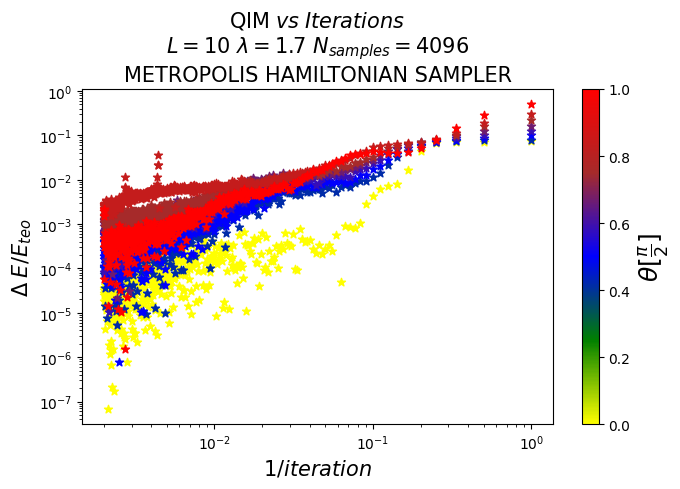

In [351]:
fig,axis=plt.subplots(1,1,figsize=(7,5))
plt.title(basis+"$"+r"\;vs\;Iterations$"+"\n"+r"$L="+str(L)+"$ $" r"\lambda="+str(round(G*DG,1))+"$"+" $N_{samples}="+str(NS)+"$"+"\n"+"METROPOLIS HAMILTONIAN SAMPLER",fontsize=15)
AA=[0,5,6,7,8,9,10,12]

for i in AA:
    axis.scatter(1/X,E[i],marker="*",color=cmap(i/Nangle*1.0))
#plt.legend()
plt.xscale("log")
plt.yscale("log")
plt.xlabel("$1/iteration$",fontsize=15)
plt.ylabel(r"$\Delta\;E/E_{teo}$",fontsize=15)

#axis.legend()
sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # ScalarMappable needs an array, even an empty one is fine
cbar = plt.colorbar(sm,ax=axis,label=r'$\theta[\frac{\pi}{2}]$')
cbar.set_label(r'$\theta[\frac{\pi}{2}]$', fontsize=18)
plt.tight_layout()
plt.savefig(MASTER_DIR+"/"+"BASIS"+basis+"L"+str(L)+"G"+str(G)+"NS"+str(NS)+"DIF_LEARNING_RATES.png")

In [352]:
#RELATIVE ERROR LAST ITERATION

In [353]:
Y=np.array(E)
T_CORR=0
N_SAMPLES=1
X_INDICES=[NR-1-T_CORR*kk for kk in range(N_SAMPLES)]
YY=[]
Y_err=[]
for ii in range(Nangle+1):
    YY.append(np.mean(Y[ii,X_INDICES]))
    Y_err.append(dE[ii,NR-1])
Y_err=np.array(Y_err)

In [354]:
PSI_TEO=np.array(PSI_TEO)
IPR_TEO=[0.0 for ii in range(Nangle+1)] 
IPR_RBM=[0.0 for ii in range(Nangle+1)]
N_M=[]
for aa in range(Nangle+1-Naffec):
    N_M.append([i for i in range(NM)])
for bb in range(Naffec):
    N_M.append(NMM[bb])
    
for phi in range(Nangle+1): 
    ############
    hi=nk.hilbert.Spin(s=1/2,N=L)
    if phi==Nangle:
        hk=nk.hilbert.Spin(s=1/2,N=L,constraint=class_WF.ParityConstraint())
        if basis=="CIM":
            hk=hi
        
    else:
        hk=hi
    #############    
    WF=PSI_TEO[phi][num_states]
    IPR_TEO[phi]=np.sum((WF**2) * np.conjugate(WF**2))
    aux_param=[]
    for kk in N_M[i]:
        param_RBM=data[kk][phi]
        P=GET_PROB_RBM(hk,param_RBM,NSPCA-1)
        aux_param.append(np.sum(np.absolute(P)**4))
    aux_param=np.array(aux_param)
    aux_param_2=[]
    for jjs in aux_param:
        if not np.isnan(jjs):
            aux_param_2.append(jjs)
    aux_param_2=np.array(aux_param_2)
    print(aux_param_2)
    IPR_RBM[phi]=np.mean(aux_param_2)
  

[0.00235539]
[0.00300417]
[0.00550195]
[0.0116341]
[0.02517583]
[0.05194618]
[0.09956919]
[0.1761084]
[0.28046533]
[0.408691]
[0.57183111]
[0.6593527]
[0.66105321]


In [355]:
PSI_TEO*PSI_TEO

array([[1.37887445e-02, 6.87130536e-03, 3.85670924e-03, ...,
        3.85670924e-03, 6.87130536e-03, 1.37887445e-02],
       [2.73005596e-02, 1.09016017e-02, 6.28887184e-03, ...,
        2.16521239e-03, 3.98544075e-03, 6.46244058e-03],
       [5.03569717e-02, 1.59304508e-02, 9.40449642e-03, ...,
        1.10928904e-03, 2.12275116e-03, 2.79761007e-03],
       ...,
       [7.26529480e-01, 7.66646290e-03, 4.93186938e-03, ...,
        6.98103218e-08, 3.22294307e-07, 8.29735078e-08],
       [7.87176361e-01, 2.06543519e-03, 1.33168383e-03, ...,
        7.89253354e-09, 4.53430522e-08, 1.39488484e-08],
       [8.08463142e-01, 4.93038066e-32, 1.92592994e-32, ...,
        2.71332603e-39, 4.29817799e-40, 5.26230837e-09]])

In [356]:
#ANGLES
ANGLES=np.array(range(Nangle+1))
Y0=None
for kk in range(Nangle+1):
    if N_pos[kk]<eps:
        continue
    else:
        Y0=kk
        break

In [357]:
norm_1 = mcolors.Normalize(vmin=np.abs(0), vmax=1)
colors_1 = [(0.0, 'white'),(1.0, "black")]
cmap_1 = LinearSegmentedColormap.from_list('gray_scale', colors_1)


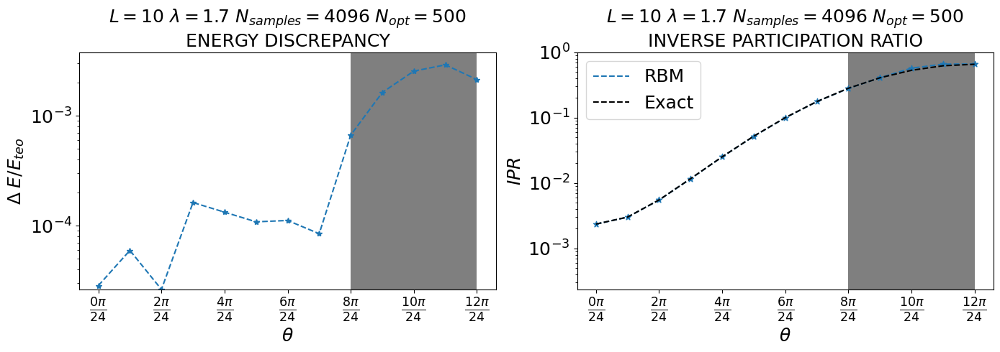

In [358]:
N_label_freq=2
fsize=18
xticks=np.arange(0,Nangle+1,N_label_freq)
x_labels=[r"$\frac{"+str(i)+r"\pi}{"+str(2*Nangle)+"}$" for i in xticks]

YYY=YY

fig,axis=plt.subplots(1,2,figsize=(14,5))

axis[0].set_title(r"$L="+str(L)+"$ $" r"\lambda="+str(round(G*DG,2))+"$"+" $N_{samples}="+str(NS)+"$"+" $N_{opt}="+str(NR)+"$"+"\n"+"ENERGY DISCREPANCY",fontsize=fsize)
axis[0].set_xticks(xticks,x_labels,fontsize=fsize)
axis[1].set_xticks(xticks,x_labels,fontsize=fsize)
axis[0].tick_params(axis='y', labelsize=fsize)
axis[1].tick_params(axis='y', labelsize=fsize)
axis[1].set_title(r"$L="+str(L)+"$ $" r"\lambda="+str(round(G*DG,2))+"$"+" $N_{samples}="+str(NS)+"$"+" $N_{opt}="+str(NR)+"$\n"+"INVERSE PARTICIPATION RATIO",fontsize=fsize)

axis[0].errorbar(ANGLES,YYY,yerr=np.sqrt(Y_err)/NN[i],marker="*",linestyle="dashed")
#if Y0!=None:
#    axis[0].fill_between(ANGLES[Y0:Nangle],np.min(YYY)/1.3,np.max(YYY)*1.3,alpha=.3)
for i in range(Nangle+1):
    axis[0].fill_between(ANGLES[i:i+2],np.min(YYY)/1.3,np.max(YYY)*1.5,color=cmap_1(N_pos[i]*1.0/max(N_pos)),alpha=.5,edgecolor=None)
    axis[1].fill_between(ANGLES[i:i+2],np.min(YYY)/1000,np.max(YYY)*1000,color=cmap_1(N_pos[i]*1.0/max(N_pos)),alpha=.5,edgecolor=None)

axis[0].set_ylim([np.min(YYY)/1.0,np.max(YYY)*1.3])
axis[1].set_ylim([np.min(IPR_TEO)/10.0,1.0])

axis[0].set_yscale("log")
axis[0].set_xlabel(r"$\theta$",fontsize=fsize)
axis[0].set_ylabel(r"$\Delta\;E/E_{teo}$",fontsize=fsize)

axis[1].scatter(ANGLES,IPR_RBM,marker="*")
axis[1].plot(ANGLES,IPR_RBM,linestyle="dashed",label="RBM")
axis[1].plot(ANGLES,IPR_TEO,color="black",linestyle="dashed",label="Exact")

axis[1].set_xlabel(r"$\theta$",fontsize=fsize)
axis[1].set_ylabel(r"$IPR$",fontsize=fsize)


#axis[0].set_xlim([0,ANGLES[Nangle-2]])
#axis[1].set_xlim([0,ANGLES[Nangle-2]])

#if Y0!=None:
#    axis[1].fill_between(ANGLES[Y0:Nangle],np.min(IPR_TEO)/20.0,np.max(IPR_TEO)*100.0,alpha=.3)
plt.legend(fontsize=fsize)
#axis[1].set_ylim([np.min(IPR_TEO)/10.0,np.max(IPR_TEO)*2.0])
axis[1].set_yscale("log")

sm = mpl.cm.ScalarMappable(cmap=cmap_1, norm=norm_1)
sm.set_array([])  # ScalarMappable needs an array, even an empty one is fine
#cbar = plt.colorbar(sm,ax=axis,label=r'$N_{+}$')
#cbar.set_label(r'$N_{+}$', fontsize=18)

plt.tight_layout()
plt.savefig("THETA_BASIS"+basis+"L"+str(L)+"G"+str(G)+"NS"+str(NS)+"IPR_ED.jpg")

In [359]:
N_pos

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1024.0, 1024.0, 1024.0, 1024.0, 0.0]

In [306]:
phi=0
k_right=[0]
k_wrong=[1]

#PARAMETERS OF THE RBM 
r=k_right[0]
w=k_wrong[0]
r_param_RBM=data[r][phi]
w_param_RBM=data[w][phi]
#THEORETICAL RBM
PSI=PSI_TEO[phi]
EXC_PSI=EXC_PSI_TEO[Nangle]
if phi==Nangle:
    hk=nk.hilbert.Spin(s=1/2,N=L,constraint=class_WF.ParityConstraint())
    if basis=="CIM":
        hk=hi
    
else:
    hk=hi
        
PSI=PSI**2
states=hk.all_states()
new_states=hi.states_to_numbers(states)

PSI=PSI[new_states]
perm = np.argsort(-PSI)
#EXP RBM
r_PSI=GET_PROB_RBM(hk,r_param_RBM,NSPCA-1)
w_PSI=GET_PROB_RBM(hk,w_param_RBM,NSPCA-1)
r_P=np.real(r_PSI*np.conjugate(r_PSI))
w_P=np.real(w_PSI*np.conjugate(w_PSI))


IndexError: list index out of range

<Figure size 640x480 with 0 Axes>

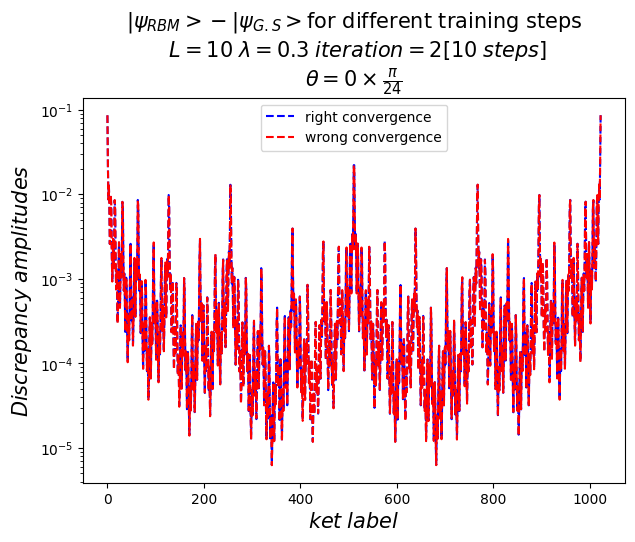

In [307]:
plt.figure()
fig,axis=plt.subplots(1,1,figsize=(7,5))
plt.title(r"$|\psi_{RBM}>-|\psi_{G.S}>$"+r"for different training steps"+ "\n"+ r" $L="+str(L)+r"\;\lambda="+str(round(G*DG,1))+r"\;iteration="+str(kk)+r"["+str(int(NR/NSPCA))+r"\;steps]$"+""+"\n"+r"$\theta="+str(phi)+r"\times\frac{\pi}{"+str(2*Nangle)+r"}$",fontsize=15)
plt.ylabel(r"$Discrepancy \;amplitudes$",fontsize=15)
plt.xlabel(r"$ket\; label$",fontsize=15)
axis.plot(np.abs(r_P),linestyle="dashed",color="blue",label="right convergence")
axis.plot(np.abs(w_P),linestyle="dashed",color="red",label="wrong convergence")
#axis.scatter(np.abs((r_P[perm]-PSI[perm])/PSI[perm]),color="red",s=10)
#axis.plot(num_states,PSI[perm]**2,color="black",label="$ket\;probability$")
axis.legend()
plt.yscale("log")
#plt.xlim([0,50])
plt.savefig(MASTER_DIR+"/DELTAP"+"AG"+str(G)+".png")

<Figure size 640x480 with 0 Axes>

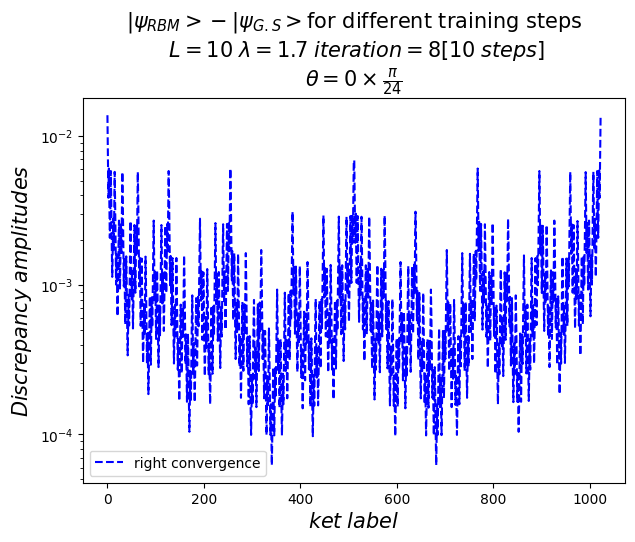

In [186]:
plt.figure()
fig,axis=plt.subplots(1,1,figsize=(7,5))
plt.title(r"$|\psi_{RBM}>-|\psi_{G.S}>$"+r"for different training steps"+ "\n"+ r" $L="+str(L)+r"\;\lambda="+str(round(G*DG,1))+r"\;iteration="+str(kk)+r"["+str(int(NR/NSPCA))+r"\;steps]$"+""+"\n"+r"$\theta="+str(phi)+r"\times\frac{\pi}{"+str(2*Nangle)+r"}$",fontsize=15)
plt.ylabel(r"$Discrepancy \;amplitudes$",fontsize=15)
plt.xlabel(r"$ket\; label$",fontsize=15)
axis.plot(PSI,linestyle="dashed",color="blue",label="right convergence")
#axis.scatter(np.abs((r_P[perm]-PSI[perm])/PSI[perm]),color="red",s=10)
#axis.plot(num_states,PSI[perm]**2,color="black",label="$ket\;probability$")
axis.legend()
plt.yscale("log")
#plt.xlim([0,50])
plt.savefig(MASTER_DIR+"/DELTAP"+"AG"+str(G)+".png")

<Figure size 640x480 with 0 Axes>

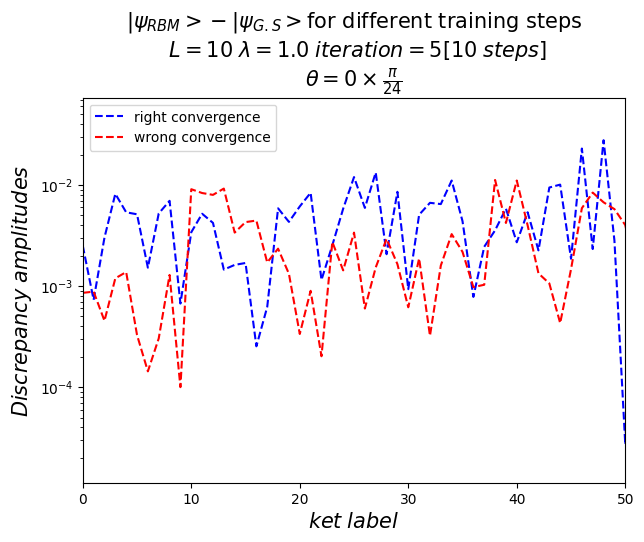

In [139]:
plt.figure()
fig,axis=plt.subplots(1,1,figsize=(7,5))
plt.title(r"$|\psi_{RBM}>-|\psi_{G.S}>$"+r"for different training steps"+ "\n"+ r" $L="+str(L)+r"\;\lambda="+str(round(G*DG,1))+r"\;iteration="+str(kk)+r"["+str(int(NR/NSPCA))+r"\;steps]$"+""+"\n"+r"$\theta="+str(phi)+r"\times\frac{\pi}{"+str(2*Nangle)+r"}$",fontsize=15)
plt.ylabel(r"$Discrepancy \;amplitudes$",fontsize=15)
plt.xlabel(r"$ket\; label$",fontsize=15)
axis.plot(np.abs((r_P[perm]-PSI[perm])/PSI[perm]),linestyle="dashed",color="blue",label="right convergence")
axis.plot(np.abs((w_P[perm]-PSI[perm])/PSI[perm]),linestyle="dashed",color="red",label="wrong convergence")
#axis.scatter(np.abs((r_P[perm]-PSI[perm])/PSI[perm]),color="red",s=10)
#axis.plot(num_states,PSI[perm]**2,color="black",label="$ket\;probability$")
axis.legend()
plt.yscale("log")
plt.xlim([0,50])
plt.savefig(MASTER_DIR+"/DELTAP"+"AG"+str(G)+".png")

<Figure size 640x480 with 0 Axes>

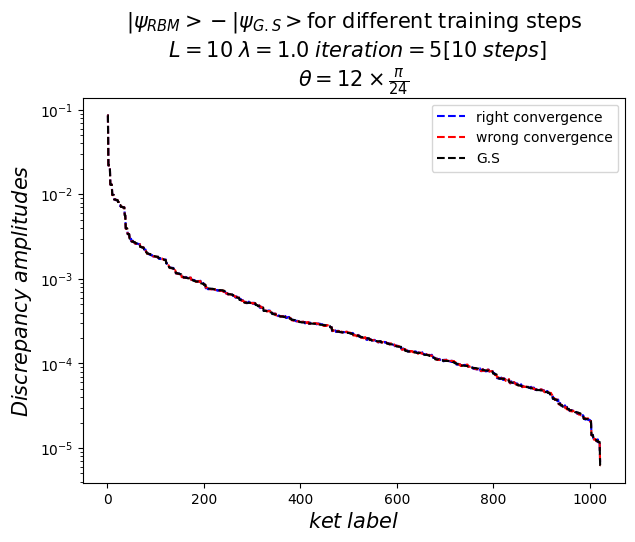

In [140]:
plt.figure()
fig,axis=plt.subplots(1,1,figsize=(7,5))
plt.title(r"$|\psi_{RBM}>-|\psi_{G.S}>$"+r"for different training steps"+ "\n"+ r" $L="+str(L)+r"\;\lambda="+str(round(G*DG,1))+r"\;iteration="+str(kk)+r"["+str(int(NR/NSPCA))+r"\;steps]$"+""+"\n"+r"$\theta="+str(12)+r"\times\frac{\pi}{"+str(2*Nangle)+r"}$",fontsize=15)
plt.ylabel(r"$Discrepancy \;amplitudes$",fontsize=15)
plt.xlabel(r"$ket\; label$",fontsize=15)
axis.plot(r_P[perm],linestyle="dashed",color="blue",label="right convergence")
axis.plot(w_P[perm],linestyle="dashed",color="red",label="wrong convergence")
axis.plot(PSI[perm],linestyle="dashed",color="black",label="G.S")

#axis.scatter(np.abs((r_P[perm]-PSI[perm])/PSI[perm]),color="red",s=10)
#axis.plot(num_states,PSI[perm]**2,color="black",label="$ket\;probability$")
axis.legend()
plt.yscale("log")
#plt.xlim([0,50])
plt.savefig(MASTER_DIR+"/DELTAP"+"AG"+str(G)+".png")

In [311]:
+w_perm = np.argsort(-w_P)
r_perm = np.argsort(-r_P)


SyntaxError: cannot assign to expression here. Maybe you meant '==' instead of '='? (14553734.py, line 1)

In [312]:
hk.numbers_to_states(w_perm[2])

NameError: name 'w_perm' is not defined

In [313]:
hk.numbers_to_states(r_perm[4])

NameError: name 'r_perm' is not defined

In [314]:
hk.numbers_to_states(perm[0])

Array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int8)

In [315]:
print(w_P[perm][0],r_P[perm][0],PSI[perm][0])

0.8714755573289272 0.2823133147018451 0.8720383060961819


In [316]:
labels=[r"$visible\;bias$",r"$dense\;bias$",r"$kernel$"]
labels_name=["visible_bias","dense_bias","kernel"]
label_par=[r"$a_i$",r"$b_i$",r"$k_{ij}$"]
ang=Nangle

In [317]:
r_Im_Z=[np.array(r_param_RBM["params"]["visible_bias"]["value"]["imag"]),np.array(r_param_RBM["params"]["Dense"]["bias"]["value"]["imag"]),np.array(r_param_RBM["params"]["Dense"]["kernel"]["value"]["imag"])]
#r_Im_Z[2]=Z[2].reshape(-1,Z[2].shape[-1])

r_real_Z=[np.array(r_param_RBM["params"]["visible_bias"]["value"]["real"]),np.array(r_param_RBM["params"]["Dense"]["bias"]["value"]["real"]),np.array(r_param_RBM["params"]["Dense"]["kernel"]["value"]["real"])]
#r_real_Z[2]=Z[2].reshape(-1,Z[2].shape[-1])

w_real_Z=[np.array(w_param_RBM["params"]["visible_bias"]["value"]["real"]),np.array(w_param_RBM["params"]["Dense"]["bias"]["value"]["real"]),np.array(w_param_RBM["params"]["Dense"]["kernel"]["value"]["real"])]
#w_real_Z[2]=Z[2].reshape(-1,Z[2].shape[-1])

w_Im_Z=[np.array(w_param_RBM["params"]["visible_bias"]["value"]["imag"]),np.array(w_param_RBM["params"]["Dense"]["bias"]["value"]["imag"]),np.array(w_param_RBM["params"]["Dense"]["kernel"]["value"]["imag"])]
#w_Im_Z[2]=Z[2].reshape(-1,Z[2].shape[-1])







0 101 101
1 101 101


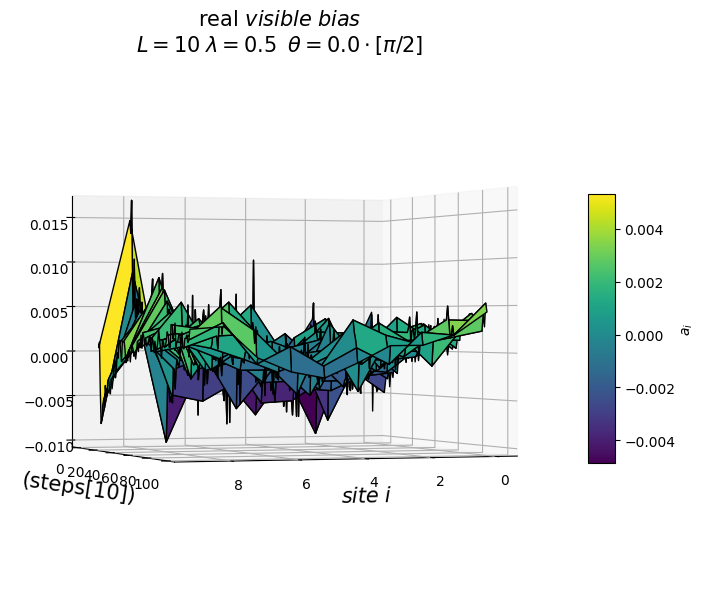

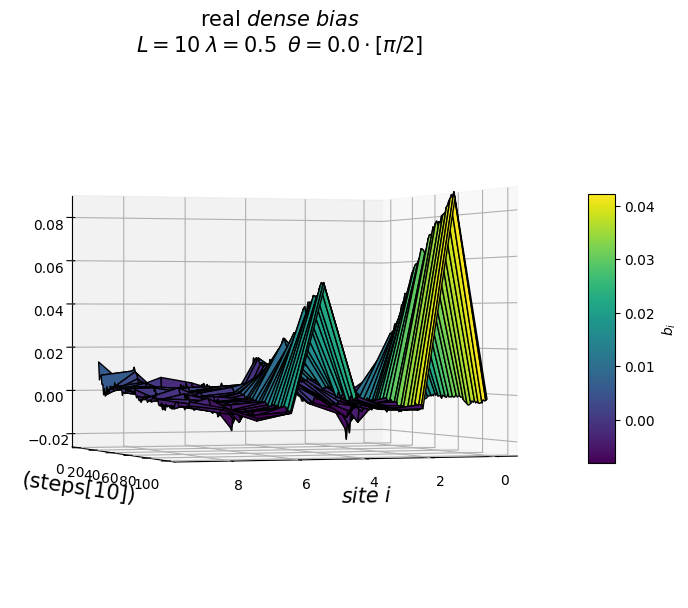

In [318]:
# Create the 3D figure
Z=r_real_Z
add="real "
for i in range(len(label_par)-1):

    X = np.arange(0,NSPCA+1, 1)  # X values (rows)
    Y = np.arange(0, len(Z[i][0]), 1)  # Y values (columns)
    print(i,len(Z[i]),len(X))
    X_mesh, Y_mesh = np.meshgrid(Y, X)
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    surf = ax.plot_surface(X_mesh, Y_mesh,Z[i], cmap='viridis', edgecolor='k')
    # Add a color bar
    cbar = fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.05)
    cbar.set_label(label_par[i])
    # Labels and title
    #ax.set_ylim([0,20])
    ax.set_xlabel(r"$site\;i$ ",fontsize=15)
    ax.set_ylabel("(steps["+str(int(NR/NSPCA))+"])",fontsize=15)
    ax.set_zlabel(label_par[i], labelpad=20,fontsize=15) 
    ax.set_title(add+labels[i]+"\n"+"$L="+str(L)+r"\;\lambda="+str(round(G*DG,1))+r"\;\;\theta="+str(angle[phi]/(np.pi/2))+r"\cdot [\pi/2]$",fontsize=15)
    ax.view_init(elev=0, azim=70)  # Adjust angles (elevation=45°, azimuth=120°)
    plt.savefig(MASTER_DIR+"/"+"theta"+str(ang)+labels_name[i]+"L"+str(L)+"G"+str(G)+".png")

0 101 101
1 101 101


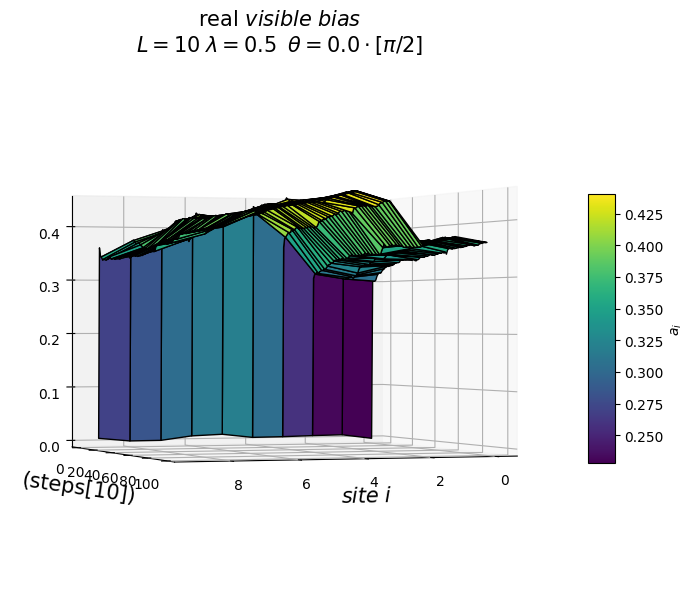

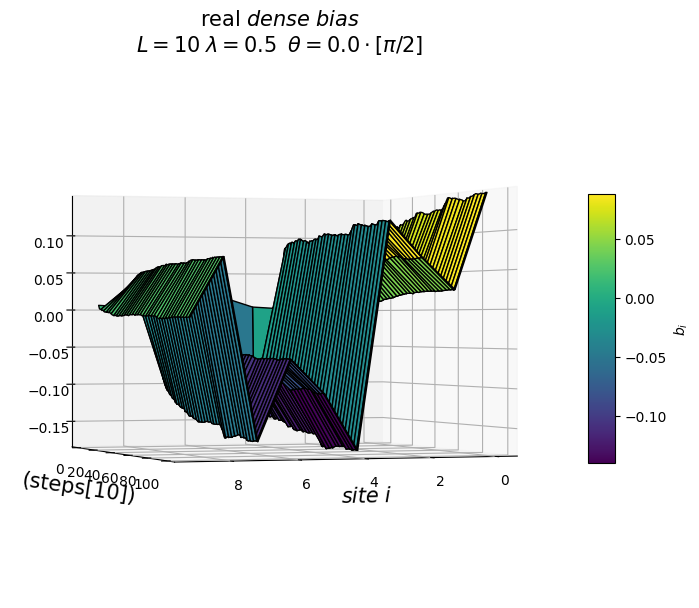

In [319]:
# Create the 3D figure
Z=w_real_Z
add="real "
for i in range(len(label_par)-1):

    X = np.arange(0,NSPCA+1, 1)  # X values (rows)
    Y = np.arange(0, len(Z[i][0]), 1)  # Y values (columns)
    print(i,len(Z[i]),len(X))
    X_mesh, Y_mesh = np.meshgrid(Y, X)
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    surf = ax.plot_surface(X_mesh, Y_mesh,Z[i], cmap='viridis', edgecolor='k')
    # Add a color bar
    cbar = fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.05)
    cbar.set_label(label_par[i])
    # Labels and title
    #ax.set_ylim([0,20])
    ax.set_xlabel(r"$site\;i$ ",fontsize=15)
    ax.set_ylabel("(steps["+str(int(NR/NSPCA))+"])",fontsize=15)
    ax.set_zlabel(label_par[i], labelpad=20,fontsize=15) 
    ax.set_title(add+labels[i]+"\n"+"$L="+str(L)+r"\;\lambda="+str(round(G*DG,1))+r"\;\;\theta="+str(angle[phi]/(np.pi/2))+r"\cdot [\pi/2]$",fontsize=15)
    ax.view_init(elev=0, azim=70)  # Adjust angles (elevation=45°, azimuth=120°)
    plt.savefig(MASTER_DIR+"/"+"theta"+str(ang)+labels_name[i]+"L"+str(L)+"G"+str(G)+".png")

In [320]:
C=np.array(r_param_RBM["params"]["Dense"]["kernel"]["value"]["real"])
# Plot the heatmap
X = np.arange(0,L, 1)  # X values (rows)
Y = np.arange(0, int(L) , 1)  # Y values (columns)
X_mesh, Y_mesh = np.meshgrid(X, Y)


<>:11: SyntaxWarning: invalid escape sequence '\;'
<>:11: SyntaxWarning: invalid escape sequence '\;'
/tmp/ipykernel_3647/3794104144.py:11: SyntaxWarning: invalid escape sequence '\;'
  ax.set_ylabel("$hidden\;site \; j$",fontsize=15)


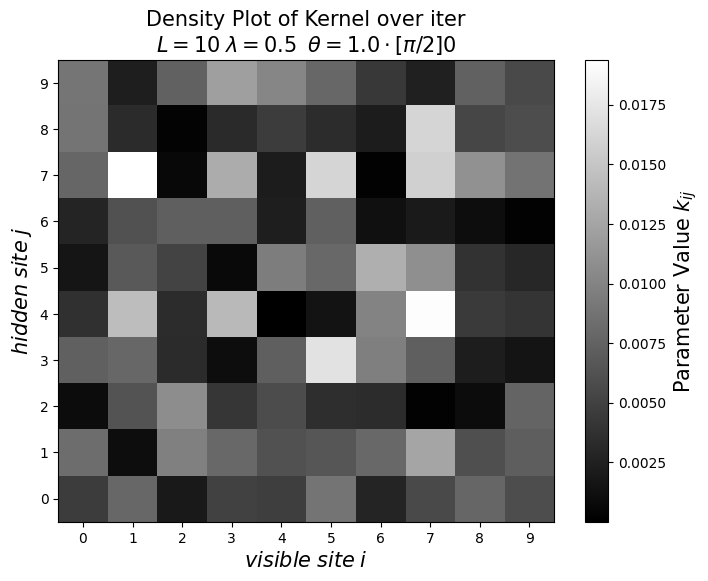

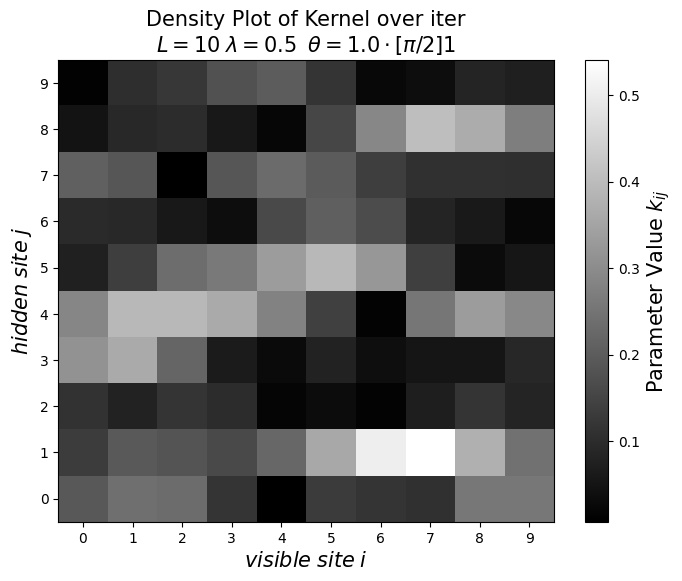

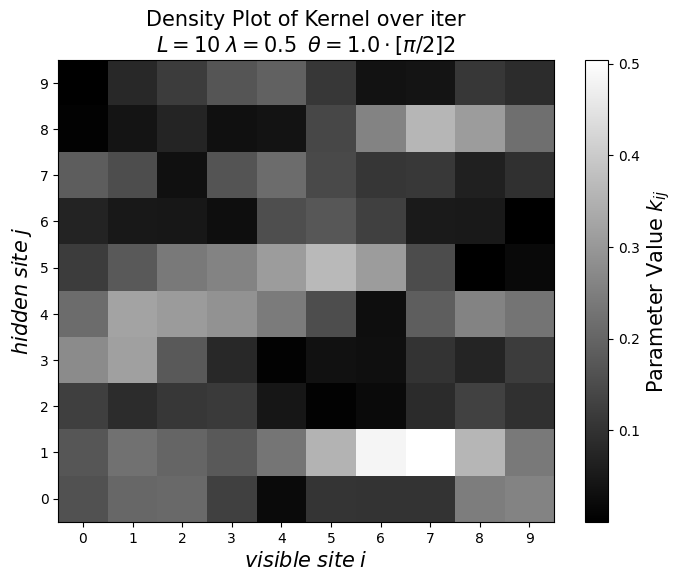

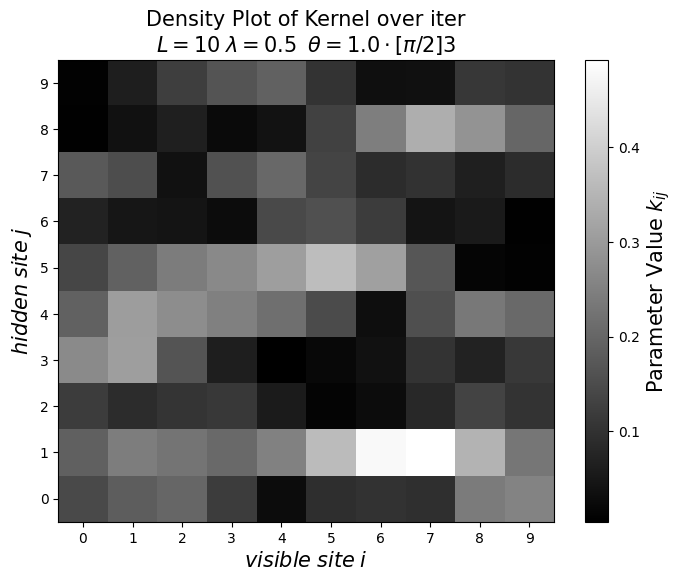

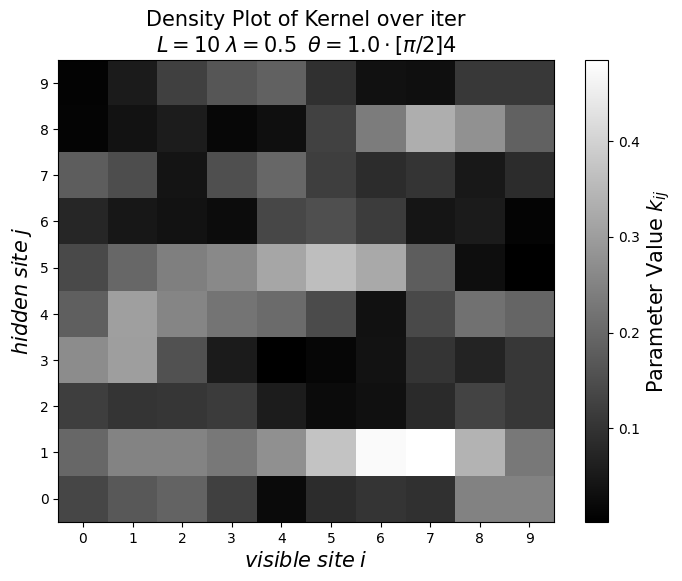

...

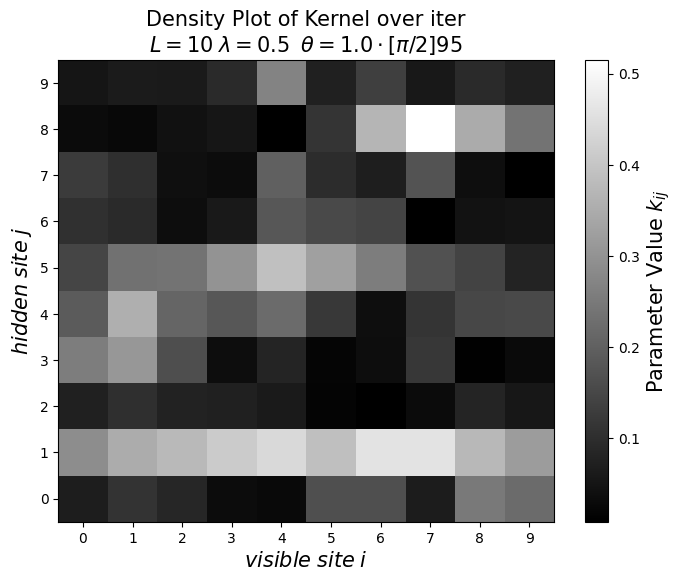

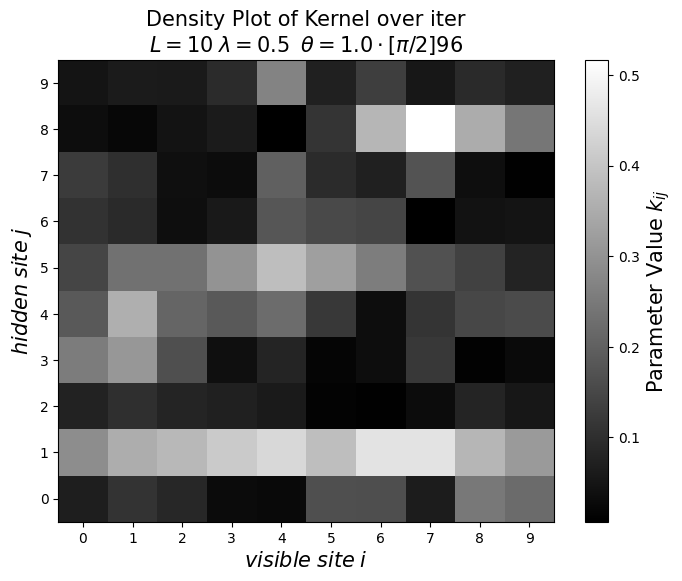

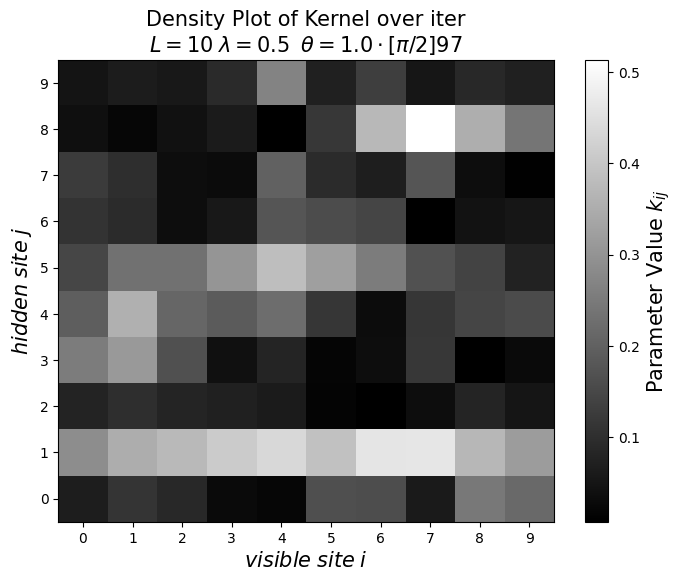

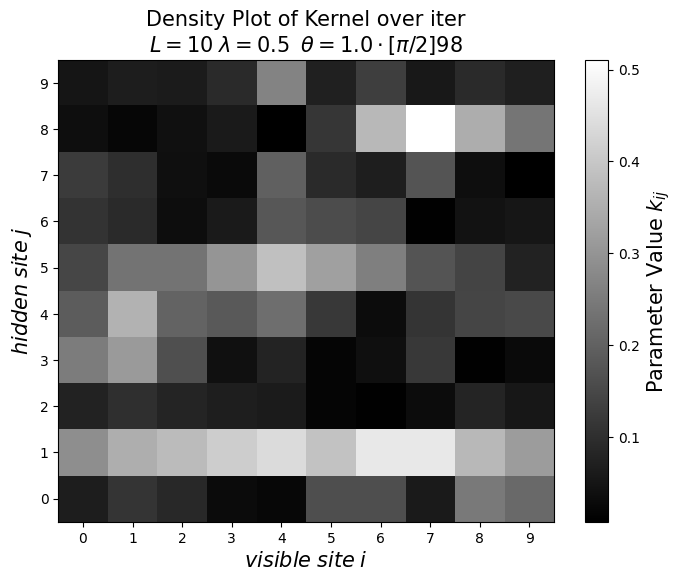

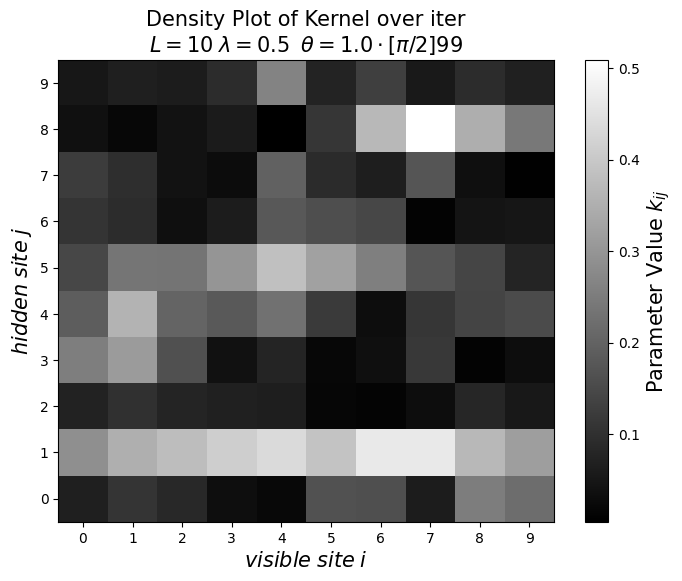

In [321]:

for i in range(NSPCA):
    fig, ax = plt.subplots(figsize=(8, 6))
    c = ax.imshow(np.abs(C[i].T), cmap='gray', aspect='auto', origin='lower')

# Add a colorbar
    cbar = fig.colorbar(c, ax=ax)
    cbar.set_label(r"Parameter Value $k_{ij}$",fontsize=15)

# Labels and title
    ax.set_xlabel(r"$visible\;site \;i$",fontsize=15)
    ax.set_ylabel("$hidden\;site \; j$",fontsize=15)
    ax.set_title(r"Density Plot of Kernel over iter"+"\n"+"$L="+str(L)+r"\;\lambda="+str(round(G*DG,1))+r"\;\;\theta="+str(angle[ang]/(np.pi/2))+r"\cdot [\pi/2]$"+str(i),fontsize=15)

# Set tick labels
    ax.set_xticks(np.arange(0,L,1))
    ax.set_xticklabels(np.arange(0,L,1))
    ax.set_yticks(np.arange(len(Y)))
    ax.set_yticklabels(Y)
    plt.savefig(MASTER_DIR+"/"+"theta"+str(ang)+"L"+str(L)+"G"+str(G)+"NS"+str(NS)+"density_over it"+str(i)+".png")
    plt.show()

In [322]:
C=np.array(w_param_RBM["params"]["Dense"]["kernel"]["value"]["real"])
# Plot the heatmap
X = np.arange(0,L, 1)  # X values (rows)
Y = np.arange(0, int(L) , 1)  # Y values (columns)
X_mesh, Y_mesh = np.meshgrid(X, Y)


<>:11: SyntaxWarning: invalid escape sequence '\;'
<>:11: SyntaxWarning: invalid escape sequence '\;'
/tmp/ipykernel_3647/3794104144.py:11: SyntaxWarning: invalid escape sequence '\;'
  ax.set_ylabel("$hidden\;site \; j$",fontsize=15)


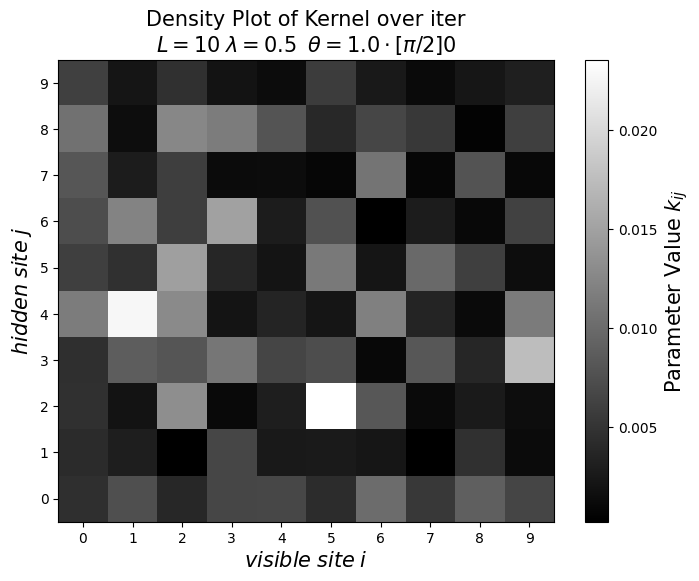

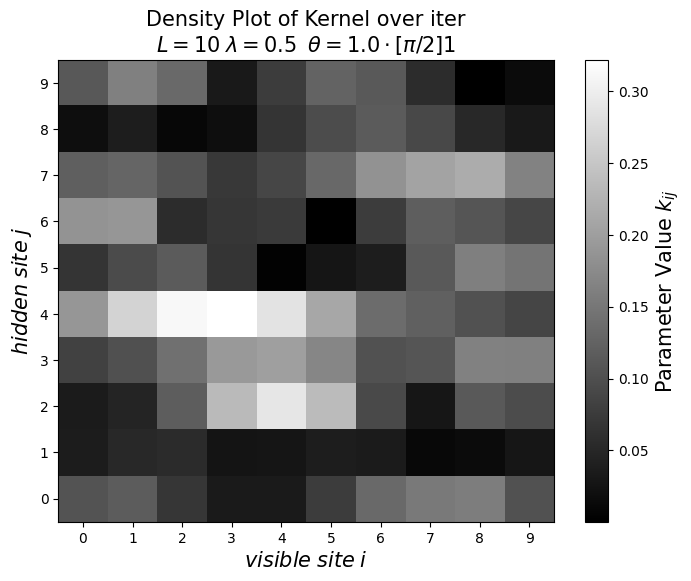

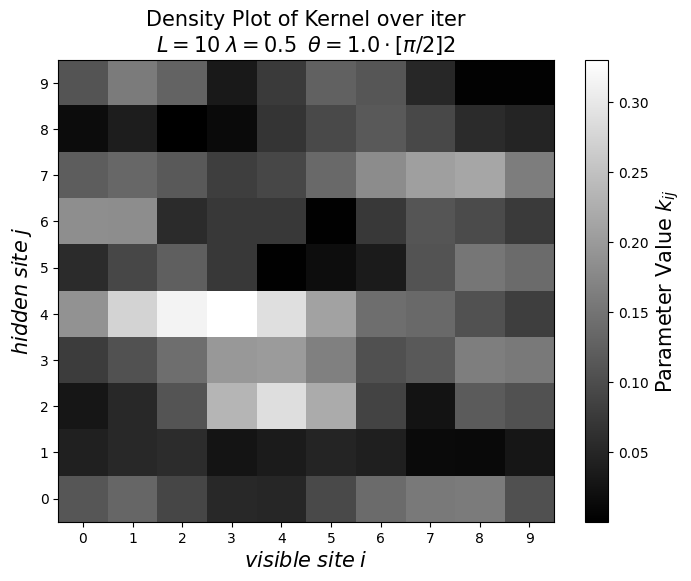

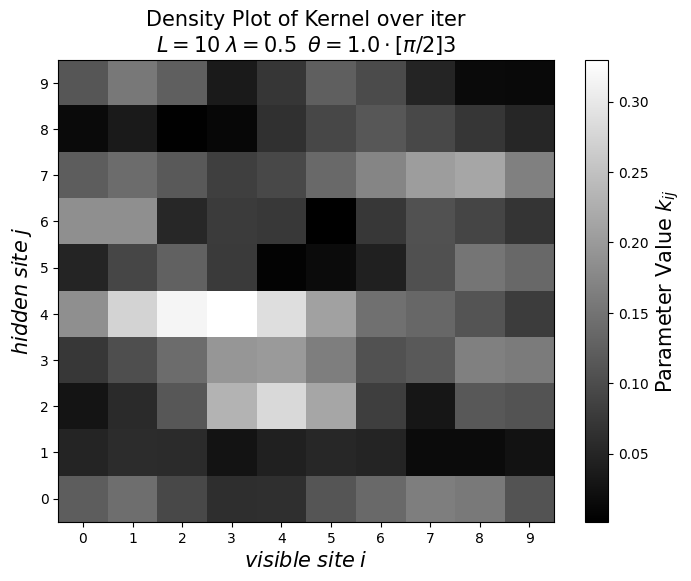

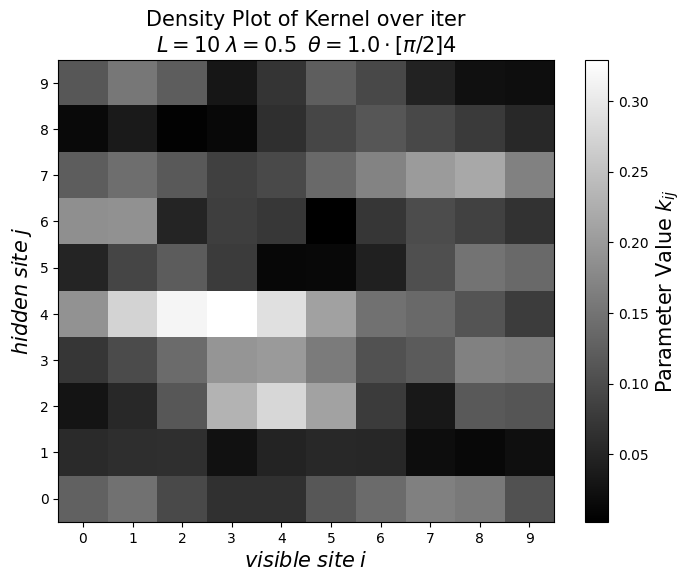

...

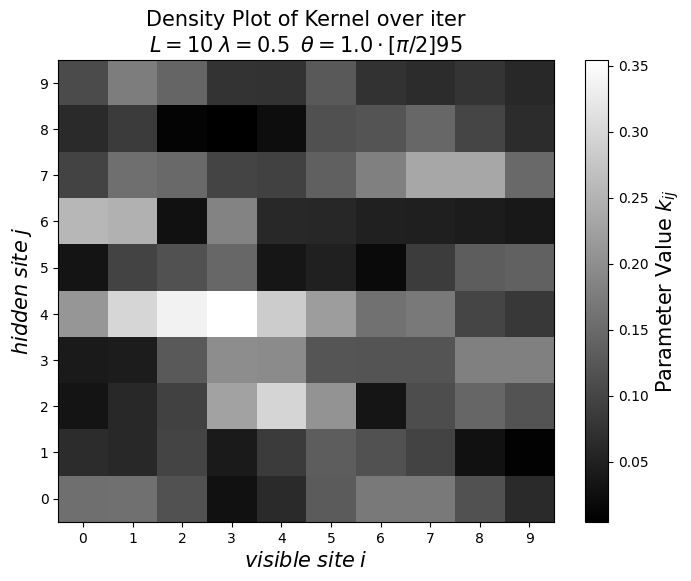

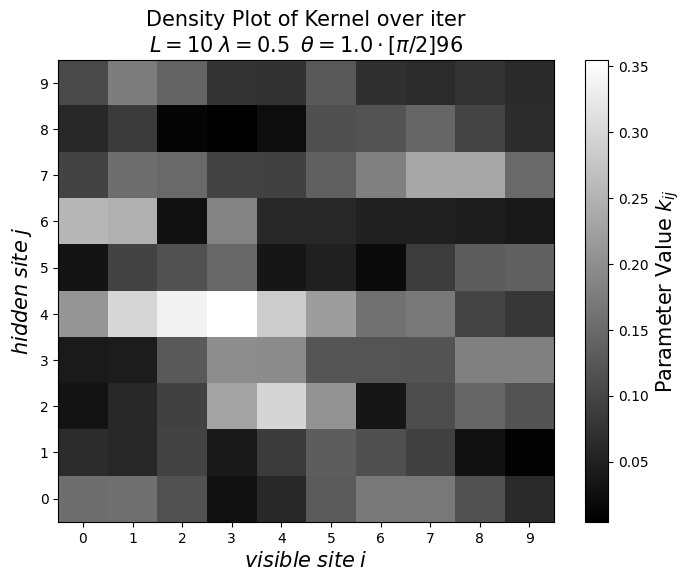

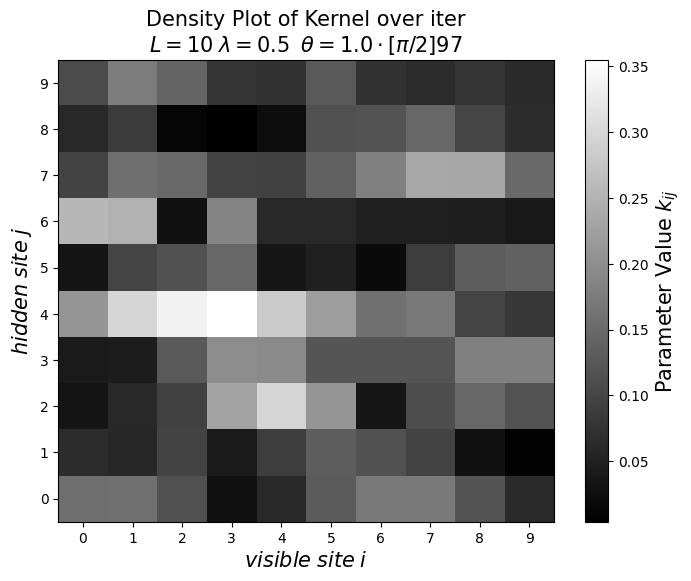

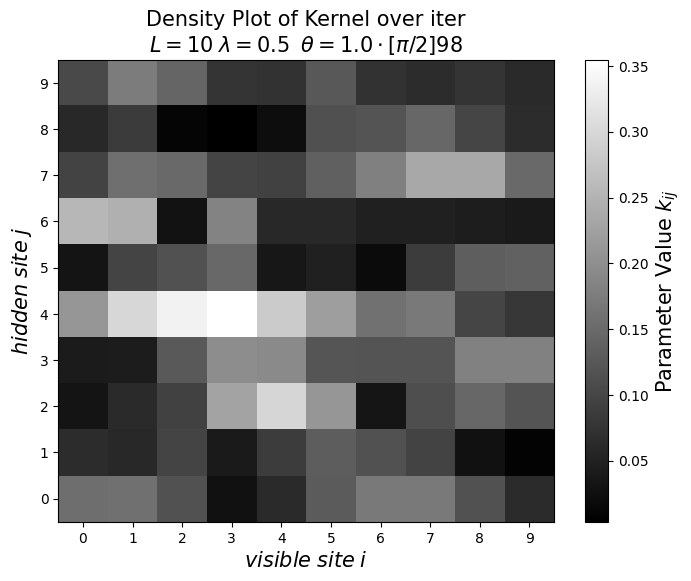

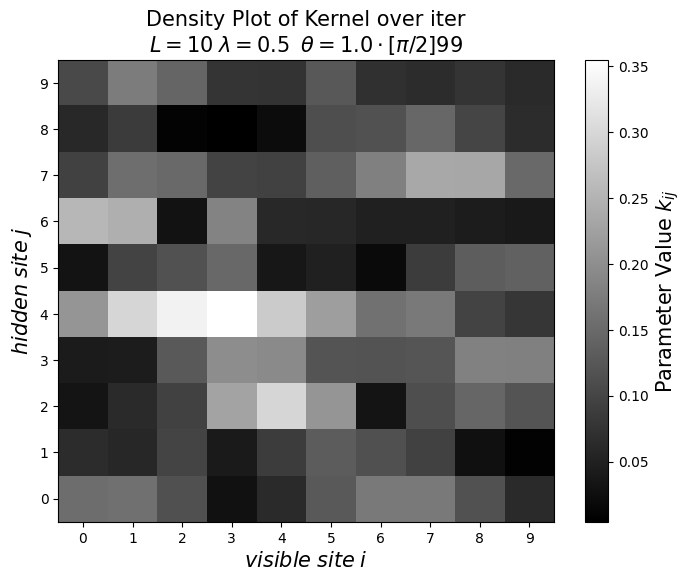

In [323]:

for i in range(NSPCA):
    fig, ax = plt.subplots(figsize=(8, 6))
    c = ax.imshow(np.abs(C[i].T), cmap='gray', aspect='auto', origin='lower')

# Add a colorbar
    cbar = fig.colorbar(c, ax=ax)
    cbar.set_label(r"Parameter Value $k_{ij}$",fontsize=15)

# Labels and title
    ax.set_xlabel(r"$visible\;site \;i$",fontsize=15)
    ax.set_ylabel("$hidden\;site \; j$",fontsize=15)
    ax.set_title(r"Density Plot of Kernel over iter"+"\n"+"$L="+str(L)+r"\;\lambda="+str(round(G*DG,1))+r"\;\;\theta="+str(angle[ang]/(np.pi/2))+r"\cdot [\pi/2]$"+str(i),fontsize=15)

# Set tick labels
    ax.set_xticks(np.arange(0,L,1))
    ax.set_xticklabels(np.arange(0,L,1))
    ax.set_yticks(np.arange(len(Y)))
    ax.set_yticklabels(Y)
    plt.savefig(MASTER_DIR+"/"+"theta"+str(ang)+"L"+str(L)+"G"+str(G)+"NS"+str(NS)+"density_over it"+str(i)+".png")
    plt.show()

In [221]:
np.nan

nan